# **Visión computacional para imágenes y video**
## **Maestría en Inteligencia Artificial Aplicada**
### **Dr. Gilberto Ochoa Ruiz**
### **Tecnológico de Monterrey**
## **Actividad 4.2 Google Colab - Algoritmos de mejoramiento de imágenes usando operaciones morfológicas**


---

### Equipo 37

- Jorge Luis Ancheyta Segovia - A01796354
- Omar Aguilar Macedo - A01797078

# 10. Morphological Operations

## Table of Contents
1. [Libraries](#libraries)
2. [Erosion](#erosion)
3. [Dilation](#dilation)
4. [Opening](#opening)
5. [Closing](#closing)
6. [Morphological Gradient](#gradient)
7. [Morphological Hats](#hats)
   1. [Top or White Hat](#top)
   1. [Black Hat](#black)
8. [Challenge](#challenge)
   1. [Aplicación de erosión](#erosion_apl)
   1. [Aplicación de dilatación](#dilation_apl)
   1. [Aplicación de opening & closing](#open_close_apl)

## Importing Libraries <a class="anchor" name="libraries" ></a>

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [2]:
img = cv2.imread("data/image.jpg")
img1 = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img2 = cv2.imread("data/image.jpg",0)

(400, 700, 3) (400, 700, 3) (400, 700)


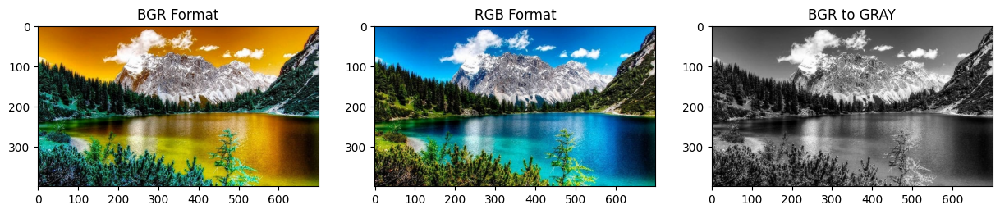

In [3]:
#function to see image
def imgshow(img=img,img1=img1,img2=img2, rows=1,columns=3):
    print(img.shape,img1.shape,img2.shape)
    fig = plt.figure(figsize=(15,8))
    #adds a subplot at 1st position
    fig.add_subplot(rows,columns,1)
    plt.title('BGR Format')
    plt.imshow(img)

    #adds a subplot at 2nd position
    fig.add_subplot(rows,columns,2)
    plt.title('RGB Format')
    plt.imshow(img1)

    #adds a subplot at 3rd position
    fig.add_subplot(rows,columns, 3)
    plt.title('BGR to GRAY')
    plt.imshow(img2,cmap="gray")
    plt.show()

imgshow(img=img,img1=img1,img2=img2, rows=1,columns=3)

## Erosion <a class="anchor" name="erosion" ></a>

Erosin primarily involves eroding(thinning) outer surface(foreground) of image
- Tt is suggested to have foreground as white

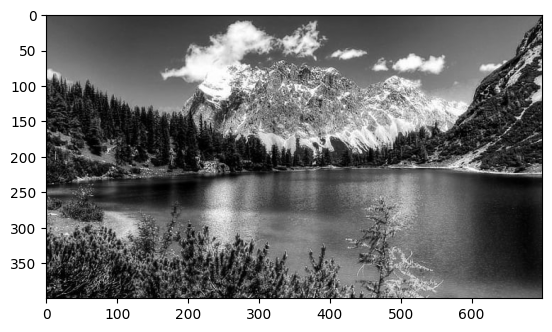

In [4]:
BGR2GRAY = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
plt.imshow(BGR2GRAY,cmap="gray")
plt.show()

Eroding boundy of image upto 3 level

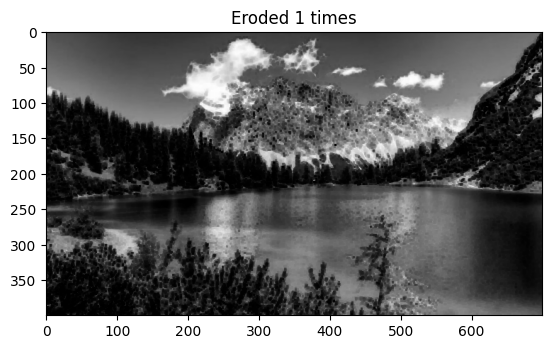

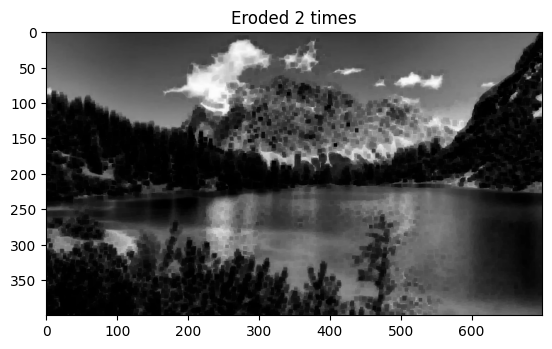

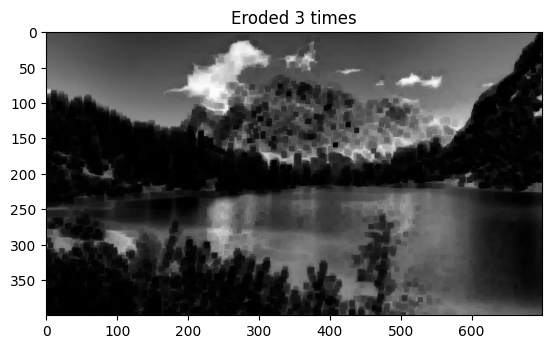

In [5]:
def plt_imshow(title, image):
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    plt.title(title)
    plt.grid(False)
    plt.show()

for i in range(0,3):
    eroded = cv2.erode(BGR2GRAY.copy(), None, iterations=i+1)
    plt_imshow("Eroded {} times".format(i+1), eroded)

### Binarize Image

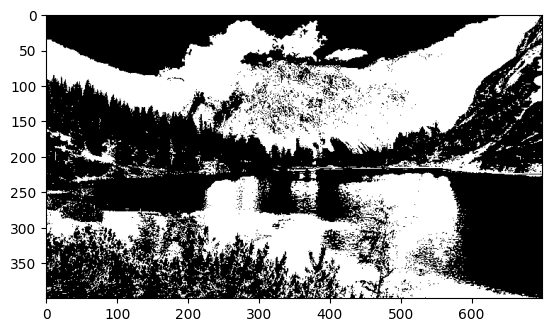

In [6]:
binr = cv2.threshold(BGR2GRAY, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]
image = cv2.cvtColor(binr, cv2.COLOR_BGR2RGB)
plt.imshow(image)
plt.show()

### We can Invert Image to keep foreground in white

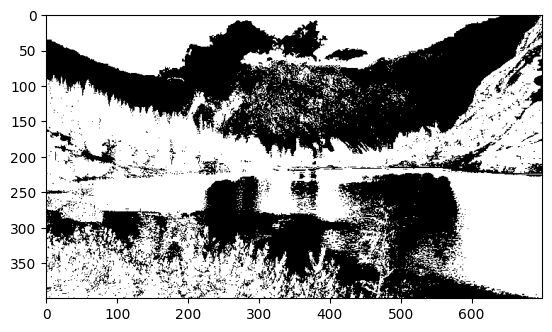

In [7]:
invert = cv2.bitwise_not(binr)
image = cv2.cvtColor(invert, cv2.COLOR_BGR2RGB)
plt.imshow(image)
plt.show()

Then, we can define a kernel of $5 \times 5$ to use in erosion

In [8]:
kernel = np.ones((5,5), np.uint8) #check for 3*3 or 7*7 kernel size too
print(kernel)

[[1 1 1 1 1]
 [1 1 1 1 1]
 [1 1 1 1 1]
 [1 1 1 1 1]
 [1 1 1 1 1]]


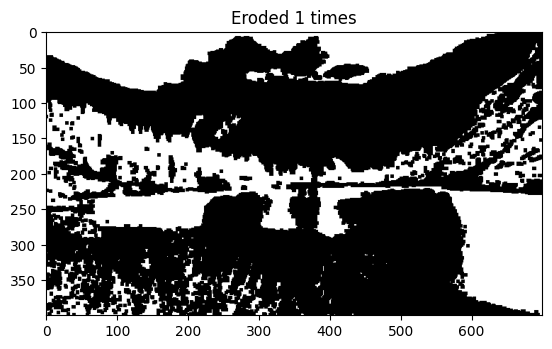

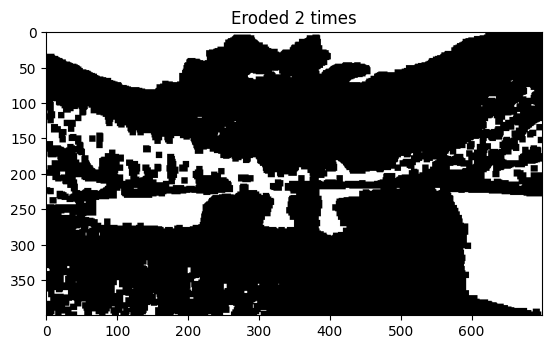

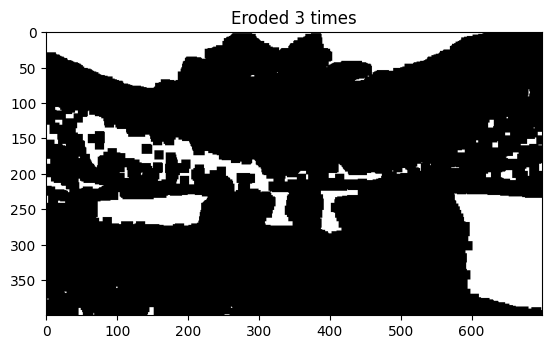

In [9]:
for i in range(0,3):
    eroded = cv2.erode(invert.copy(),kernel=kernel, iterations=i+1)
    plt_imshow("Eroded {} times".format(i+1), eroded)

## Dilation <a class="anchor" name="dilation" ></a>

Involves dilating outer surface (foreground) of image
- For joining broken parts of an image together

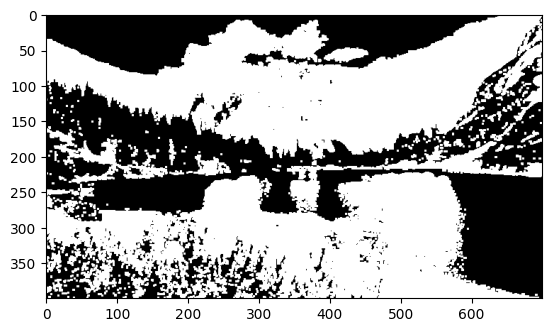

In [10]:
#binarize image
binr = cv2.threshold(BGR2GRAY,0,255,cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]
kernel = np.ones((3,3),np.uint8)
invert = cv2.bitwise_not(binr)

#dilate image
dilation = cv2.dilate(binr, kernel, iterations=1)

plt.imshow(dilation, cmap='gray')
plt.show()

We can apply series of dilations on inverted image using no kernel


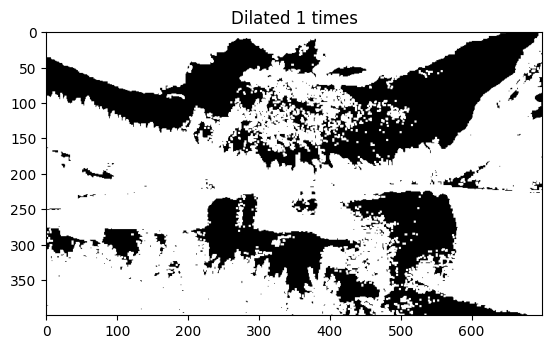

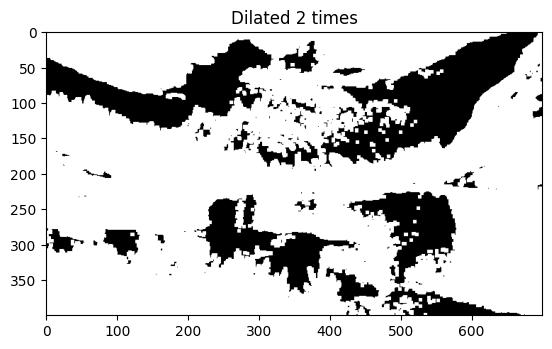

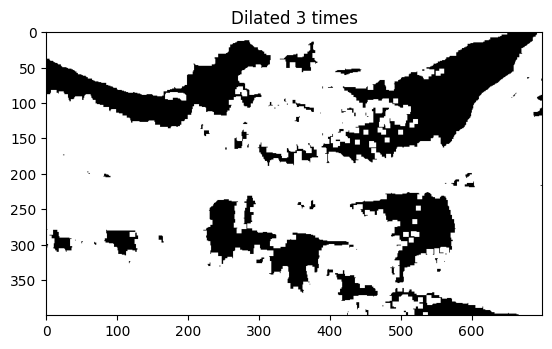

In [11]:
for i in range(0,3):
    dilated = cv2.dilate(invert.copy(),None,iterations= i+1)
    plt_imshow("Dilated {} times".format(i+1),dilated)

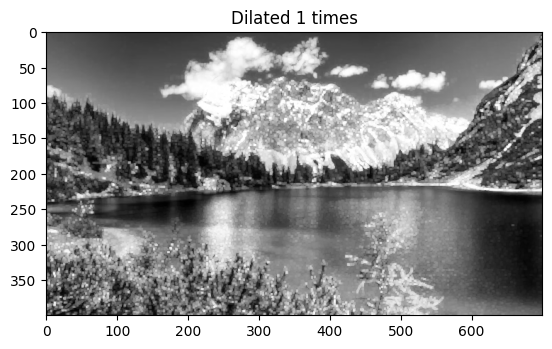

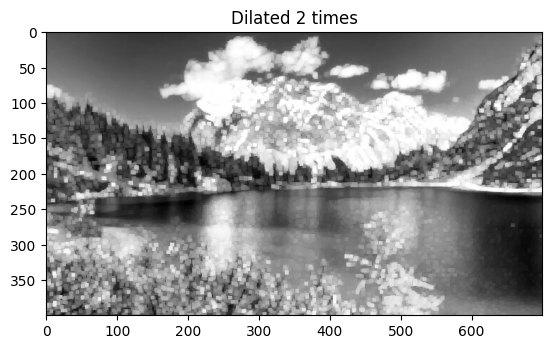

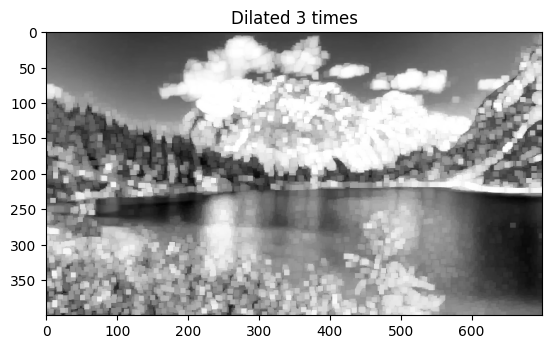

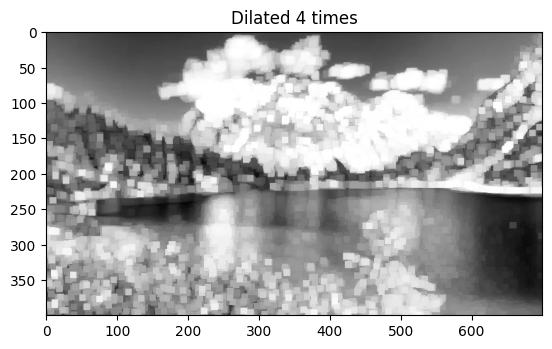

In [12]:
for i in range(0,4):
    dilated = cv2.dilate(BGR2GRAY.copy(),None,iterations= i+1)
    plt_imshow("Dilated {} times".format(i+1),dilated)

## Opening <a class="anchor" name="opening" ></a>

Erosion followed by dilation in outer surface (foreground) of image
- Generally used to remove noise (small blobs) in image


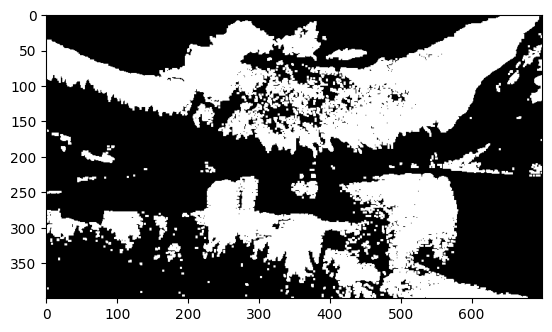

In [13]:
#opening image
opening = cv2.morphologyEx(binr,cv2.MORPH_OPEN,kernel,iterations=1)

#print output
plt.imshow(opening, cmap='gray')
plt.show()

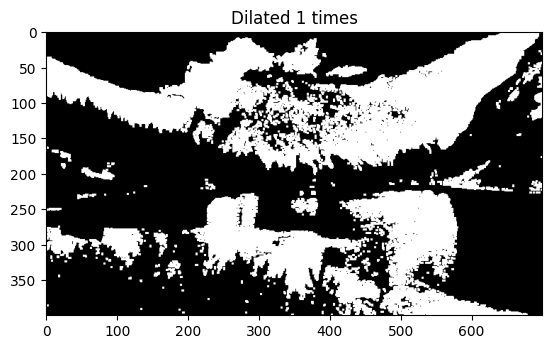

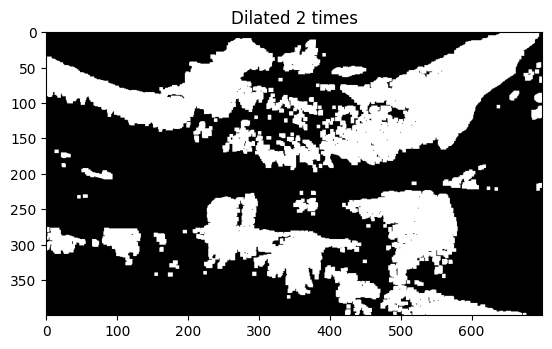

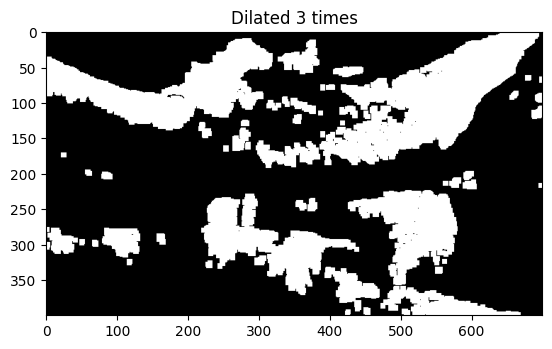

In [14]:
for i in range(0,3):
    opening = cv2.morphologyEx(binr.copy(),cv2.MORPH_OPEN,None,iterations= i+1)
    plt_imshow("Dilated {} times".format(i+1),opening)
    plt.show()

## Closing <a class="anchor" name="closing" ></a>

Dilation followed by erosion in outer surface (foreground) of image
- Generally used to close holes inside of objects or for connecting components together

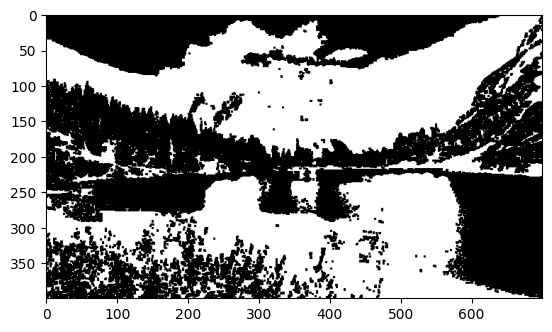

In [15]:
#closing image
closing = cv2.morphologyEx(binr, cv2.MORPH_CLOSE, kernel, iterations=1)

#print output
plt.imshow(closing,cmap='gray')
plt.show()

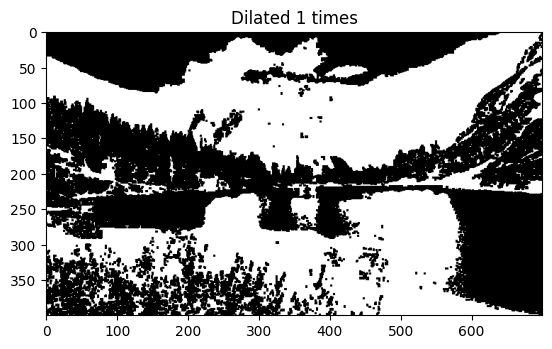

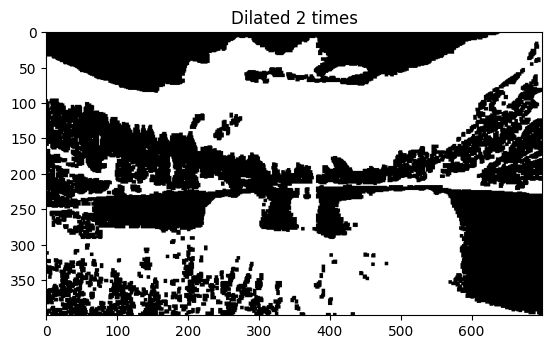

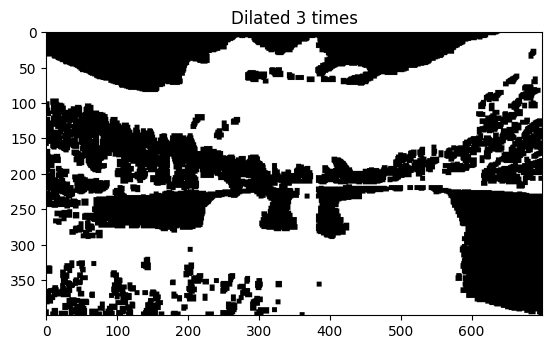

In [16]:
for i in range(0,3):
    closing = cv2.morphologyEx(binr.copy(),cv2.MORPH_CLOSE,None,iterations= i+1)
    plt_imshow("Dilated {} times".format(i+1),closing)
    plt.show()

Iterating with different kernels

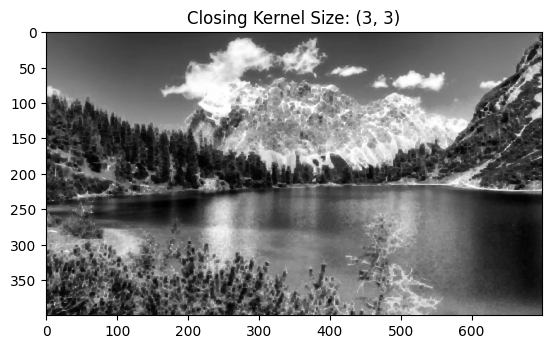

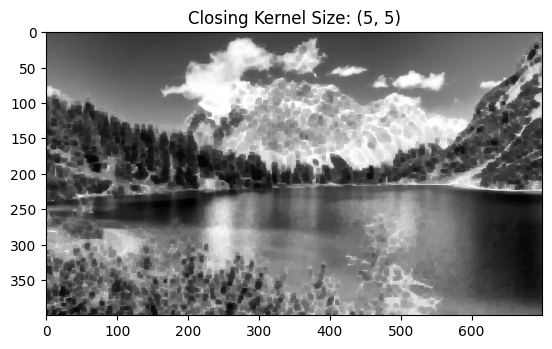

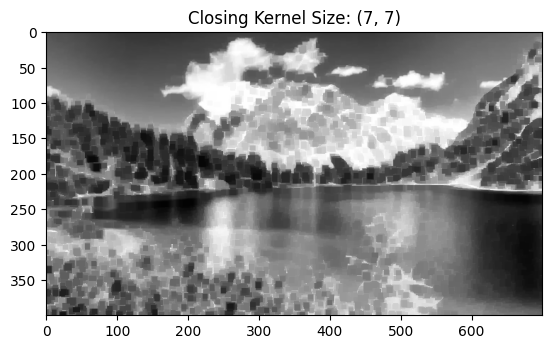

In [17]:
kernelSizes = [(3,3), (5,5), (7,7)]
BGR2GRAY = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

for kernelSize in kernelSizes:
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, kernelSize)
    closing = cv2.morphologyEx(BGR2GRAY, cv2.MORPH_CLOSE, kernel)
    plt_imshow("Closing Kernel Size: ({}, {})".format(kernelSize[0], kernelSize[1]), closing)

## Morphological Gradient <a class="anchor" name="gradient" ></a>

It first applies erosion and dilation individually on image and then computes difference between eroded and dilated image

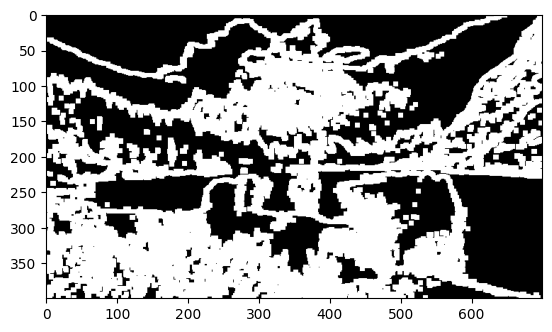

In [18]:
# use morph gradient
morph_gradient = cv2.morphologyEx(invert,cv2.MORPH_GRADIENT,kernel)

#print output
plt.imshow(morph_gradient, cmap='gray')
plt.show()

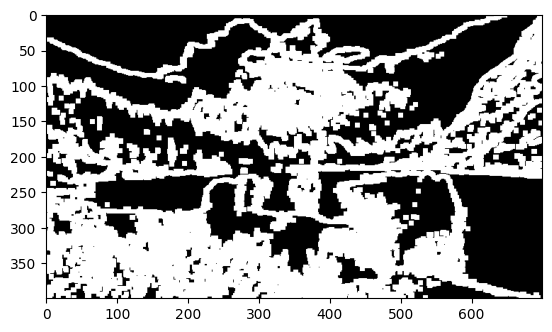

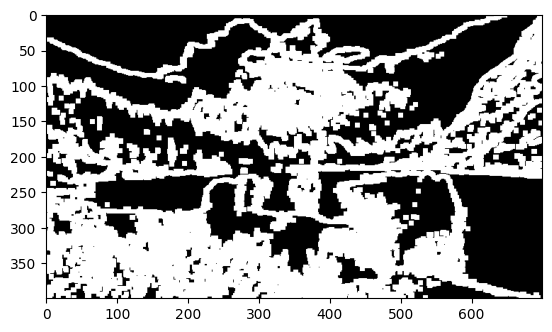

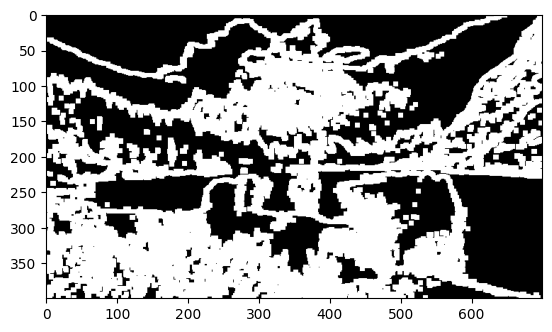

In [19]:
for i in range(0,3):
    # use morph gradient
    morph_gradient = cv2.morphologyEx(invert,cv2.MORPH_GRADIENT,kernel+i)
    #print output
    plt.imshow(morph_gradient, cmap='gray')
    plt.show()

Iterating with different kernels

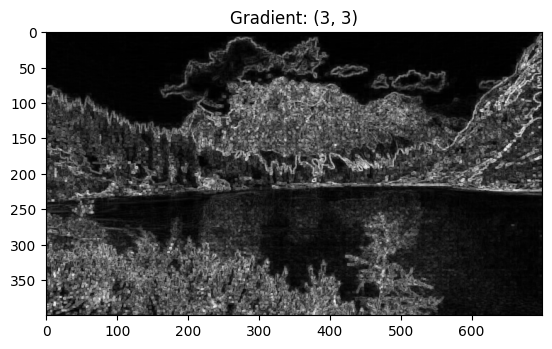

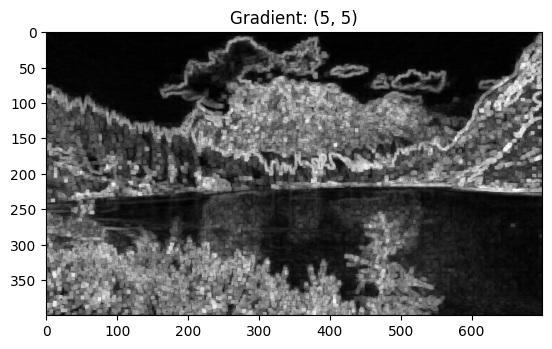

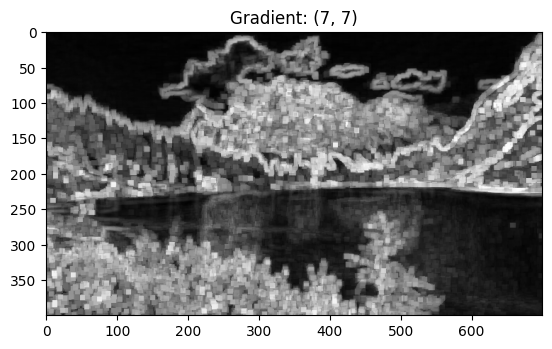

In [20]:
kernelSizes = [(3,3), (5,5), (7,7)]
BGR2GRAY = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

for kernelSize in kernelSizes:
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, kernelSize)
    gradient = cv2.morphologyEx(BGR2GRAY, cv2.MORPH_GRADIENT, kernel)
    plt_imshow("Gradient: ({}, {})".format(
        kernelSize[0], kernelSize[1]), gradient)

## Morphological Hats <a class="anchor" name="hats" ></a>

1. Top or White Hat
2. Black hat

### Top or White Hat <a class="anchor" name="top" ></a>

It is the difference between original (grayscale/single channel) input image and opening image

- Finds light(bright) regions of an image on dark background


In [21]:
#construct a kernel (13x5)
kernel = cv2.getStructuringElement(cv2.MORPH_RECT,(13,5))
kernel

array([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]], dtype=uint8)

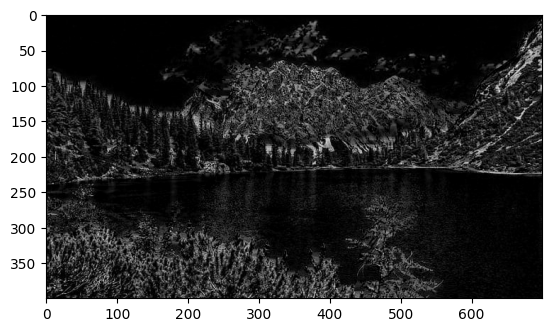

In [22]:
tophat = cv2.morphologyEx(BGR2GRAY, cv2.MORPH_TOPHAT, kernel)

plt.imshow(tophat, cmap='gray')
plt.show()

### Black Hat <a class="anchor" name="black" ></a>

Output is a difference between input image & opened image
- Finds dark regions on a light background


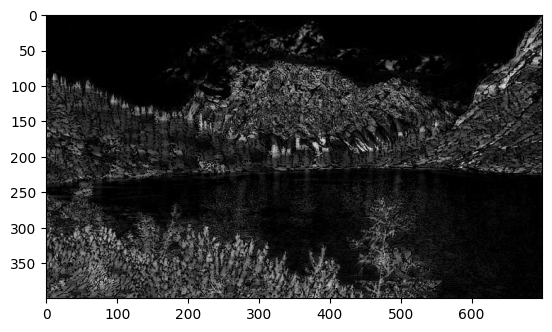

In [23]:
blackhat = cv2.morphologyEx(BGR2GRAY,cv2.MORPH_BLACKHAT,kernel)

plt.imshow(blackhat, cmap='gray')
plt.show()

## Challenge <a name="challenge"/>

a) Investigar una aplicación de erosión en procesamiento de imágenes e implementarlo en Colab

a) Investigar una aplicación de dilatación en procesamiento de imágenes e implementarlo en Colab

c) Investigar una aplicación de opening y closing e implementalo en Google Colab


In [24]:
# Imports
import numpy as np
from scipy.ndimage import binary_erosion, binary_dilation

In [25]:
# utils
def create_cross_kernel(n):
  kernel = np.zeros((n, n), dtype=np.uint8)
  center = n // 2
  # ajusta la fila del centro en 1s
  kernel[center, :] = 1
  # ajusta la columna del centro en 1s
  kernel[:, center] = 1
  return kernel

import numpy as np

def create_circular_kernel(size):
    kernel = np.zeros((size, size), dtype=np.uint8)
    center = (size - 1) / 2
    radius = (size - 1) / 2

    for i in range(size):
        for j in range(size):
            # calculamos distancia al centro
            distance = np.sqrt((i - center)**2 + (j - center)**2)
            # ajusta a uno si la distancia esta dentro del radio
            if distance <= radius:
                kernel[i, j] = 1
    return kernel

# prob = 0.05 -> 5% of pixels with noise
def add_salt_peper_noise(img, prob = 0.05):
  noisy = img.copy()
  rnd = np.random.rand(*img.shape)
  noisy[rnd < (prob / 2)] = 0       # pimienta (negro)
  noisy[rnd > 1 - (prob / 2)] = 255 # sal (blanco)
  return noisy


def read_image_gray(path):
  # Read image in grayscale
  return cv2.imread(path, cv2.IMREAD_GRAYSCALE)

def binarize(img, threshold = 0, invert = True, offset = cv2.THRESH_OTSU):
  # Convert to binary image
  bin = cv2.threshold(img, threshold, 255, cv2.THRESH_BINARY + offset)[1]
  if invert:
    bin = cv2.bitwise_not(bin)
  return bin

def plot_sources(img, bin, figsize=(8,6)):
  # plot source images original in grayscale and binary
  bin_img = cv2.cvtColor(bin, cv2.COLOR_BGR2RGB)
  plt.figure(figsize=figsize)
  plt.subplot(1, 2, 1); plt.title("Original Grayscale"); plt.imshow(img, cmap="gray"); plt.axis("off")
  plt.subplot(1, 2, 2); plt.title("Original Binary"); plt.imshow(bin_img, cmap="gray"); plt.axis("off")

def plot_results(bin, kernels, op, figsize=(28,12), n_iter = 3):
  # plot binary image with different kernels and iterations
  plt.figure(figsize=figsize)
  rows = n_iter
  cols = len(kernels)

  plt_count = 1
  for iterations  in range(1, n_iter + 1):
    for kernel, kernel_name in kernels:
      transf = cv2.morphologyEx(bin, op, kernel, iterations=iterations).astype(np.uint8)
      plt.subplot(rows, cols, plt_count); plt.title(f"{kernel_name}, iter = {iterations}"); plt.imshow(transf, cmap="gray"); plt.axis("off")
      plt_count += 1


In [26]:
# Kernels
kernels = [
    (np.ones((3,3), np.uint8), "3x3"),
    (create_cross_kernel(3), "Cross 3x3"),
    # Igual al de cruz 3x3 por lo que se queda comentado
    # (create_circular_kernel(3), "Circular 3x3"),
    (np.ones((5,5), np.uint8), "5x5"),
    (create_cross_kernel(5), "Cross 5x5"),
    (create_circular_kernel(5), "Circular 5x5"),
    (np.ones((7,7), np.uint8), "7x7"),
    (create_cross_kernel(7), "Cross 7x7"),
    (create_circular_kernel(7), "Circular 7x7")
]

# Data
lunetas = read_image_gray("data/lunetas.jpg")
lunetas = add_salt_peper_noise(lunetas, 0.01)
lunetas_bin = binarize(lunetas)

hsh = read_image_gray("data/hwh.jpg")
hsh_bin = binarize(hsh)

letra_j = read_image_gray("data/open_cv_j.png")
letra_j = add_salt_peper_noise(letra_j, 0.1)
letra_j_bin = binarize(letra_j, threshold = 50, invert = False, offset = 0)

letra_j_close = cv2.morphologyEx(letra_j_bin, cv2.MORPH_OPEN, kernel=kernels[4][0], iterations=1).astype(np.uint8)

### Introducción

El procesamiento morfológico de imágenes es una técnica de procesamiento no linea que tiene sus bases en la teoría de conjuntos y se utilizá para realzar la geometría y forma de los objetos y para extracción de regiones útiles [1][2].

En esta ocasión trataremos con cuatro conceptos: erosión, dilatación, apertura y cierre. Todas estas operaciones dependen de un element estructurante, que en si es un pequeño conjunto de forma conocida que se utiliza para "sondear" una imagen. [1]




### Aplicación de Erosión <a name="erosion_apl" />

La erosión binaria se define con la formula:
$$A \ominus B = \{\, z \in E \mid B_z \subseteq A \,\}$$

Esta se encarga de reducir el tamaño de los objetos dentro de una imagen binaria, basado en un elemento estructurante, si los objetos son mas pequeños que este elemento estructurante, estos desaparecen [3]

Dentro de las aplicaciones comunes de la erosión están:
  - Eliminación de componentes o ruido: Se utilizan para eliminar estructuras d primer plano (foreground) [4]

Para nuestros ejemplo usamos dos imagenes de muestra:
- imagen de lunetas, a la cual se le aplicó un poco de ruido:
  - usar erosión nos permite eliminar parte de este ruido en las estructuras de primer plano (lunetas), pero no en su totalida, del mismo modo se aplicaron diferentes formas de kernel e iteraciones para comparar los mejores resultados, para este caso un kernel circular de 3x3 con una iteración, nos permitió obtener mejor eliminacion de ruido, a mayor número de iteraciones y mayor kernel, las lunetas se comienzan a perder.

- imagen con un letrero que dice "home sweet home":
  - esta imagen nos permitión ver como con más iteraciones, podemos empezar a separar cada letra, aunque se comienzan a perder mas detalles de cada letra conforme el kernel crece, lo cual nos indica que la erosión no es tan útil por si sola en casos de detección de letras.


In [27]:
# Ejemplo de erosión visto en una matriz

# matriz 5x5
img = np.array([
    [0,0,0,0,0],
    [0,1,1,1,1],
    [0,1,1,1,1],
    [0,1,1,1,1],
    [0,0,0,0,0]
], dtype=np.uint8)

# kernel 3x3
kernel = np.ones((3,3), dtype=np.uint8)

# erosión
eroded = binary_erosion(img, structure=kernel).astype(np.uint8)

print("Matriz Original:\n", img)
print()
print("Matriz con erosión:\n", eroded)

Matriz Original:
 [[0 0 0 0 0]
 [0 1 1 1 1]
 [0 1 1 1 1]
 [0 1 1 1 1]
 [0 0 0 0 0]]

Matriz con erosión:
 [[0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 1 1 0]
 [0 0 0 0 0]
 [0 0 0 0 0]]


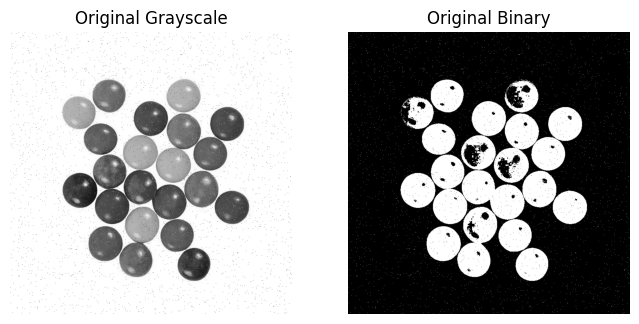

In [28]:
# Ejmplo Lunetas
plot_sources(lunetas, lunetas_bin)

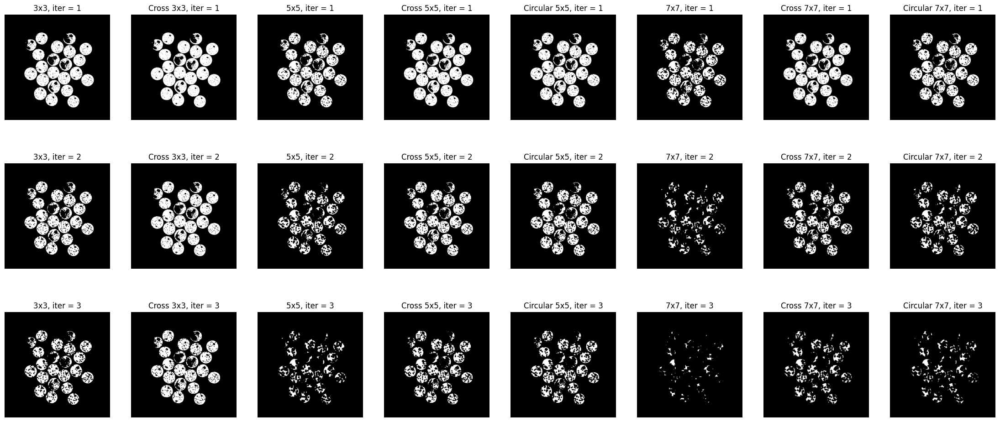

In [29]:
plot_results(lunetas_bin, kernels, cv2.MORPH_ERODE)

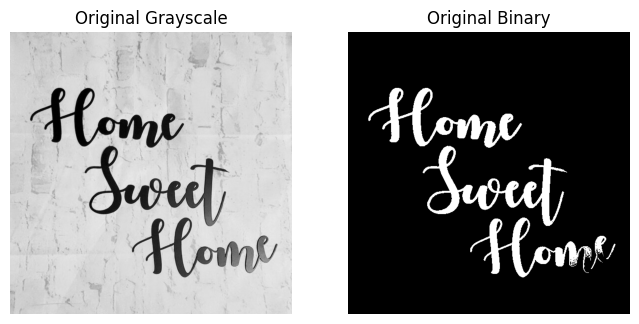

In [30]:
# Ejmplo Home Sweet Home
plot_sources(hsh, hsh_bin)

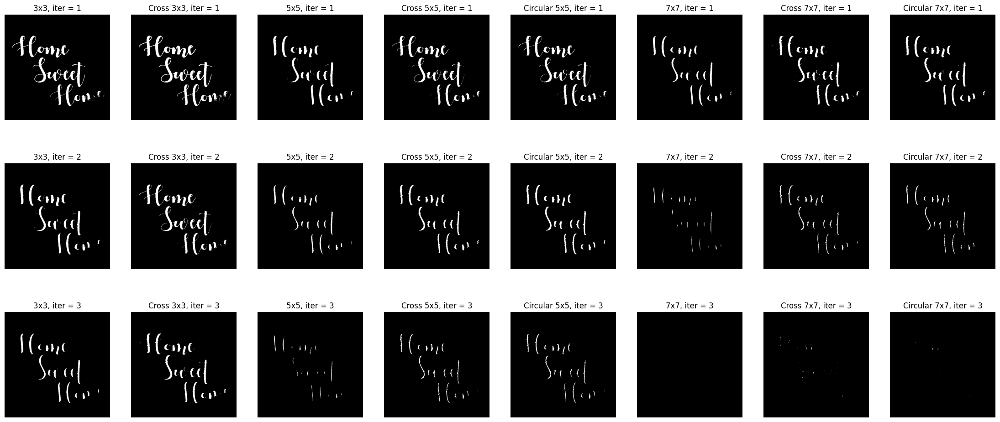

In [31]:
plot_results(hsh_bin, kernels, cv2.MORPH_ERODE)

### Aplicación de Dilatación <a name="dilation_apl" />


La dilatación binaria se define con la formula:

$$A \oplus B = \{\, z \in E \mid (B̂)_z \cap A \neq \emptyset \,\}$$

Dentro de las aplicaciones comunes de la erosión están:
  - Reparación de rupturas: Se utiliza para cerrar pequeños huecos o unir segmentos rotos en caractéres. [1][3]


Para nuestros ejemplo usamos dos imagenes de muestra:
- imagen de lunetas, a la cual se le aplicó un poco de ruido:
  - usar dilatación en este caso nos permitió darnos cuenta de que es poco práctico aplicarlo en una imagen con ruido, ya que conforme se crece el kernel o se aumentan las iteraciones lo único que hacemos es intensificar este ruido.

- imagen con un letrero que dice "home sweet home":
  - para el caso de las letras, pudimos observar como cada letra fue creciendo de tamaño pero esto resaltá la información de dichas letras, aunque con kernels mayores esta iformación puede llegarse a perder al empezar a combinarse las letras.


In [32]:
# Ejemplo de dilatación visto en una matriz

# imagen 5x5
img = np.array([
    [0,0,0,0,0],
    [0,0,0,1,0],
    [0,0,0,0,0],
    [0,1,0,0,0],
    [0,0,0,0,0]
], dtype=np.uint8)

# kernel 3x3
kernel = np.ones((3,3), dtype=np.uint8)

# dilatación
dilated = binary_dilation(img, structure=kernel).astype(np.uint8)

print("Matriz Original:\n", img)
print()
print("Matriz con dilatación:\n", dilated)

Matriz Original:
 [[0 0 0 0 0]
 [0 0 0 1 0]
 [0 0 0 0 0]
 [0 1 0 0 0]
 [0 0 0 0 0]]

Matriz con dilatación:
 [[0 0 1 1 1]
 [0 0 1 1 1]
 [1 1 1 1 1]
 [1 1 1 0 0]
 [1 1 1 0 0]]


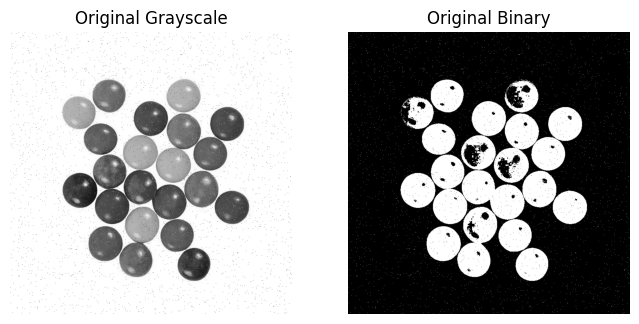

In [33]:
# Ejemplo Lunetas
plot_sources(lunetas, lunetas_bin)

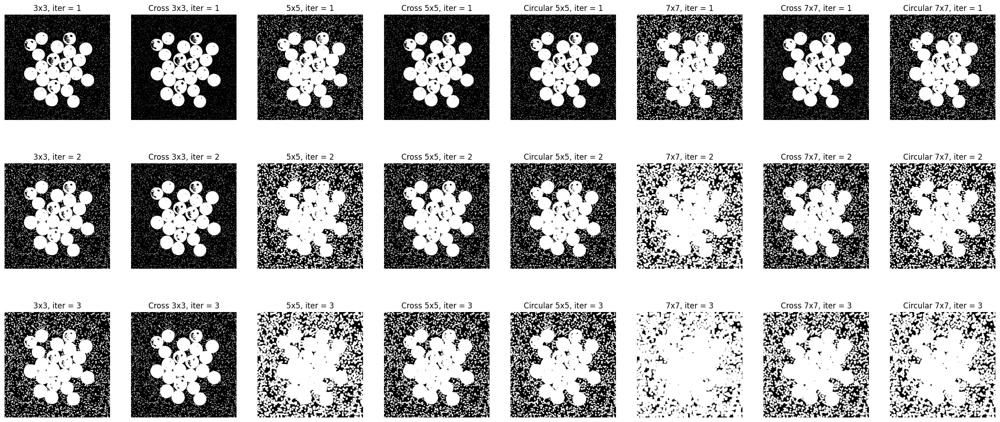

In [34]:
plot_results(lunetas_bin, kernels, cv2.MORPH_DILATE)

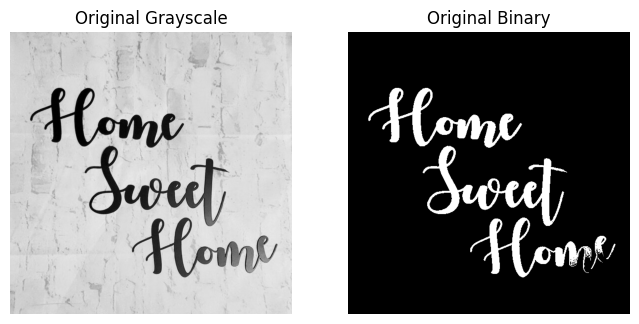

In [35]:
# Ejemplo Home Sweet Home
plot_sources(hsh, hsh_bin)

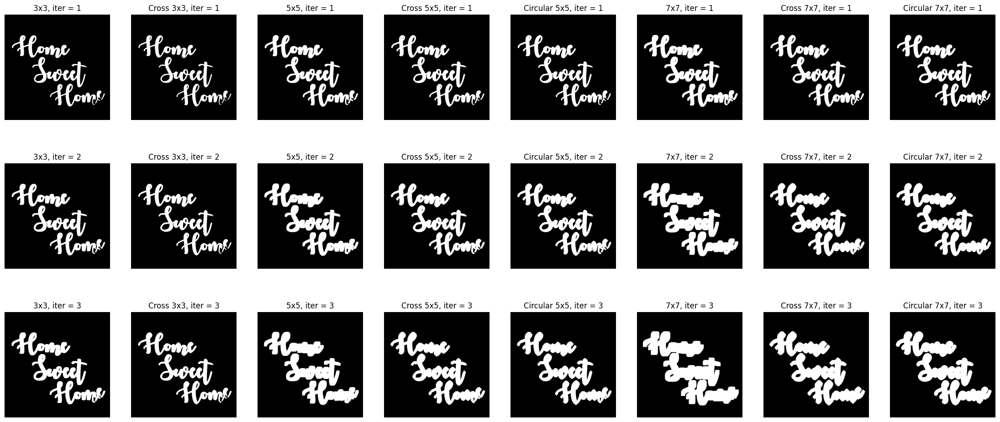

In [36]:
plot_results(hsh_bin, kernels, cv2.MORPH_DILATE)

### Aplicación de Opening y Closing <a name="open_close_apl" />

#### **Apertura/Opening**
Es una operación compuesta que combina erosión y dilatacióny suele ayudar a suavizar contornos, rompiendo istmos estrechos y eliminando detalles delgados [1][4]

Dentro de sus usos se encuentra el eliminar ruido brillante, se utiliza para mejoramiento y filtrado de imagenes, ayuda a remover estructuras de primer plano pequeñas y brillantes. También en granulometrías para análisis de texturas. [4][3][2]

Para nuestros ejemplo usamos una imagen de una letra j, a la cual se le aplicó un poco de ruido:
  - al usar apertura podemos ver que efectivamente se elimina el ruido de fondo en su mayoría y la letra vuelve a tomar forma, pero al igual que en otros casos, nos dimos cuentas que los kernels más pequeños tienden a tener mejores resultados.
  - para los ejemplos de la luneta y el letrero, opening funcionó mejor para la imagen de la luneta, pero esto fue porque la imagen tenia ruido inicial, lo cual al aplicar primero la erosión de esta función elimina dicho ruido.


#### **Cierre/Closing**

Es una operación inversa a la apertura, también ayuda a suavizar bordes pero generalmente rellenando huecos, y fusionando rupturas estrechas [1][4]

Dentro de sus usos se encuentra el relleno de huecos, se utiliza para mejorar y filtrar imagenes, rellenando roturas estrecha, huecos pequeños y largas hendiduras delgadas, también es útil para eliminar estructuras de fondo u objetos oscuros. [4][3]

Para nuestros ejemplo usamos una imagen de una letra j, que obtuvimos de la aplicación de opening a la letra j del ejmplo anterior:
  - la imagen fuente, se muetra una letra J con varios huecos, el aplicar closing nos permitió juntarlos y que la letra tomara forma nuevamente, en este caso un kernel de 5x5 fue el que nos dió mejores resultados.

  - para los ejemplos de la luneta y el letrero, closing funcionó mejor para la imagen del letrero, ya que remarco más las letras de la imagen.

#### Opening
Opening sirve para

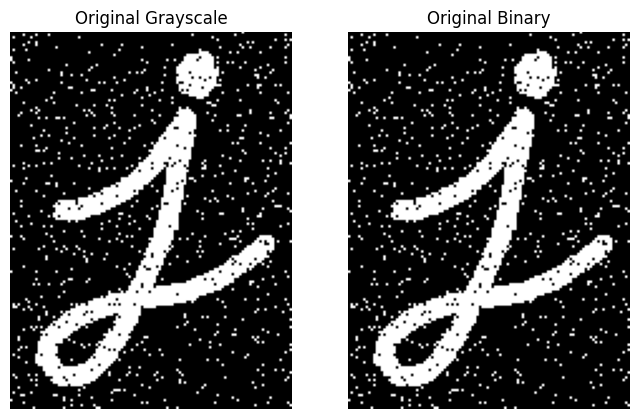

In [37]:
# Opening
plot_sources(letra_j, letra_j_bin)

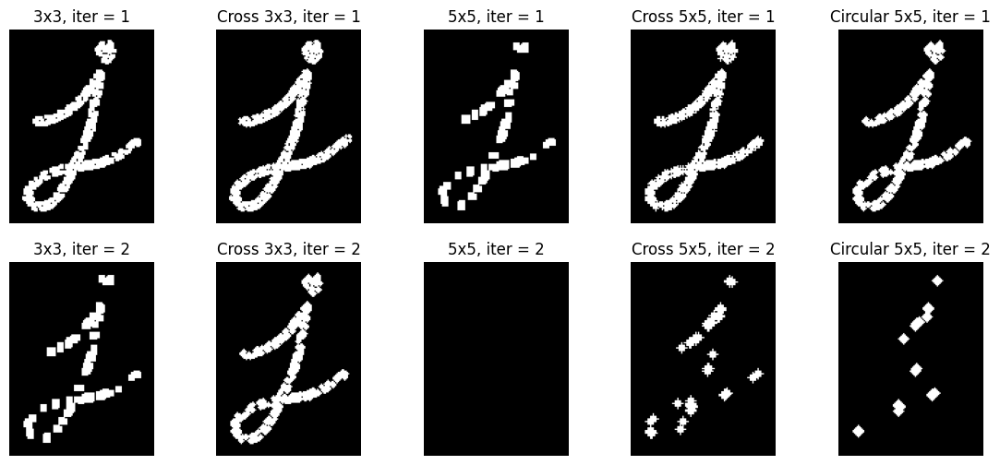

In [38]:
plot_results(letra_j_bin, kernels[0:5], cv2.MORPH_OPEN, n_iter = 2, figsize=(14, 6))

#### Closing
Closing sirve para

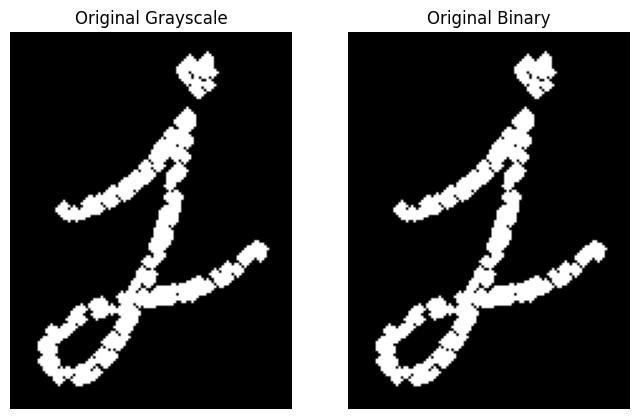

In [39]:
plot_sources(letra_j_close, letra_j_close)

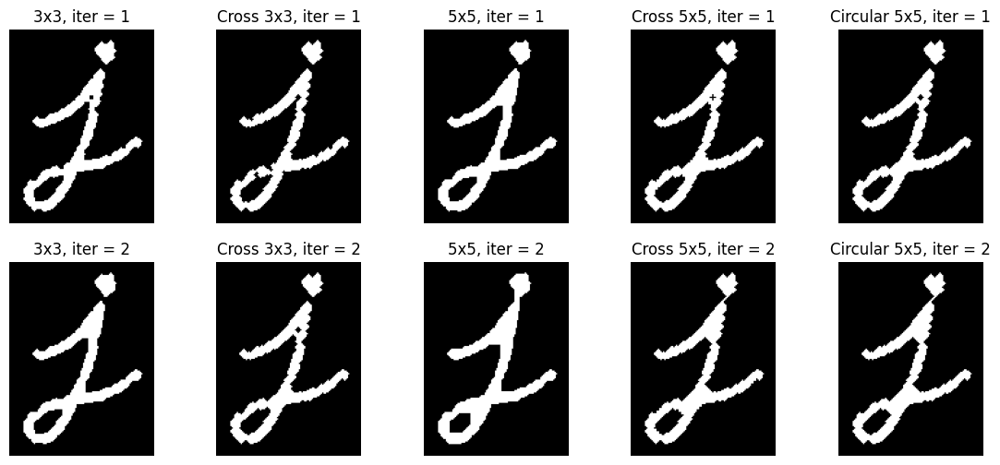

In [40]:
plot_results(letra_j_close, kernels[0:5], cv2.MORPH_CLOSE, n_iter = 2, figsize=(14, 6))

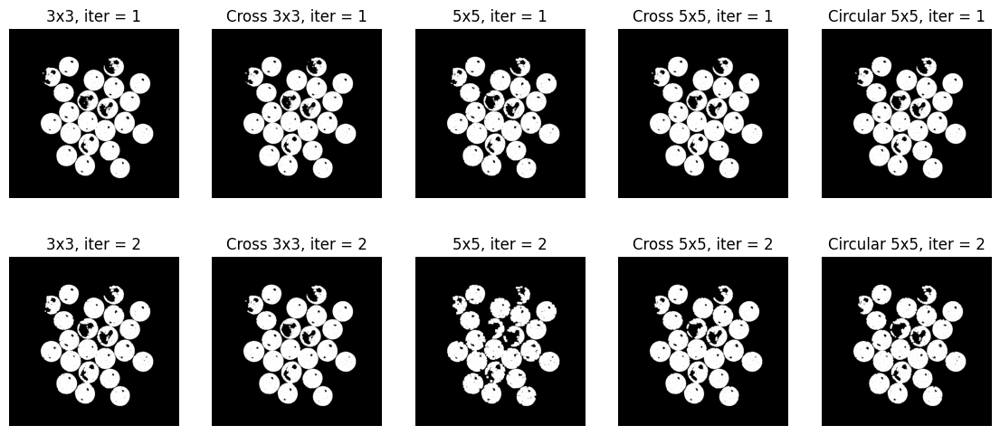

In [41]:
# Opening
plot_results(lunetas_bin, kernels[0:5], cv2.MORPH_OPEN, n_iter = 2, figsize=(14, 6))

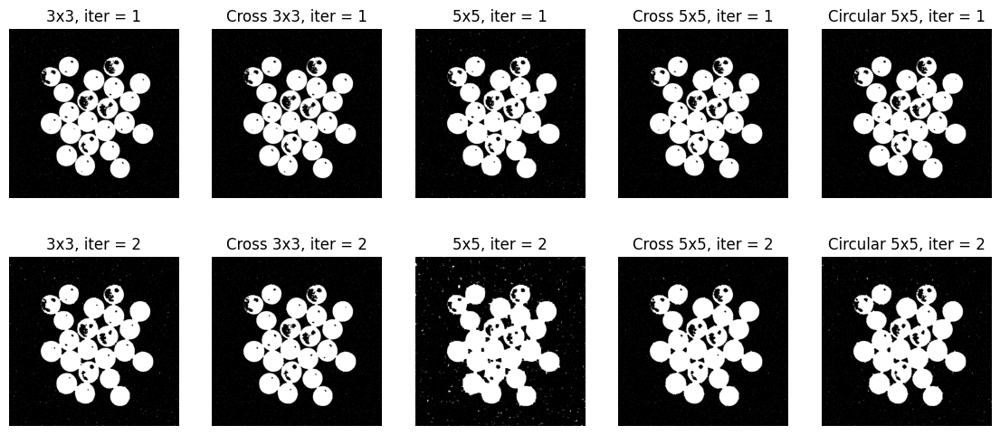

In [42]:
# Closing
plot_results(lunetas_bin, kernels[0:5], cv2.MORPH_CLOSE, n_iter = 2, figsize=(14, 6))

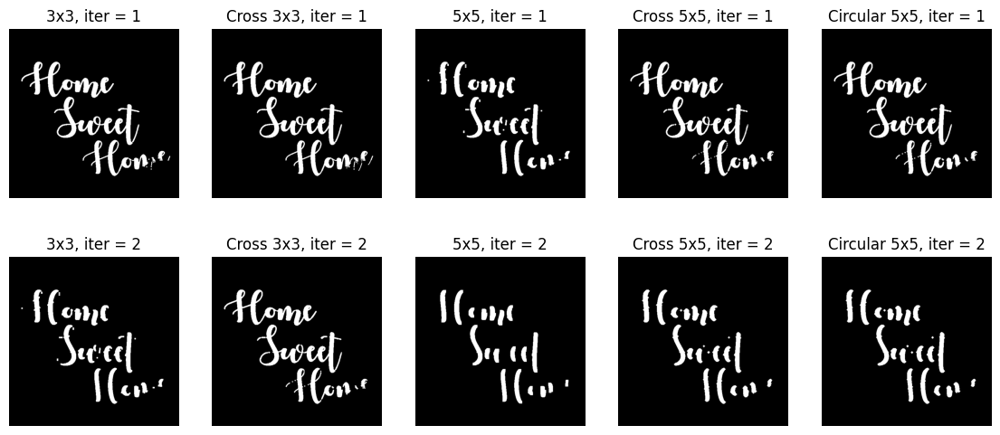

In [43]:
# Opening
plot_results(hsh_bin, kernels[0:5], cv2.MORPH_OPEN, n_iter = 2, figsize=(14, 6))

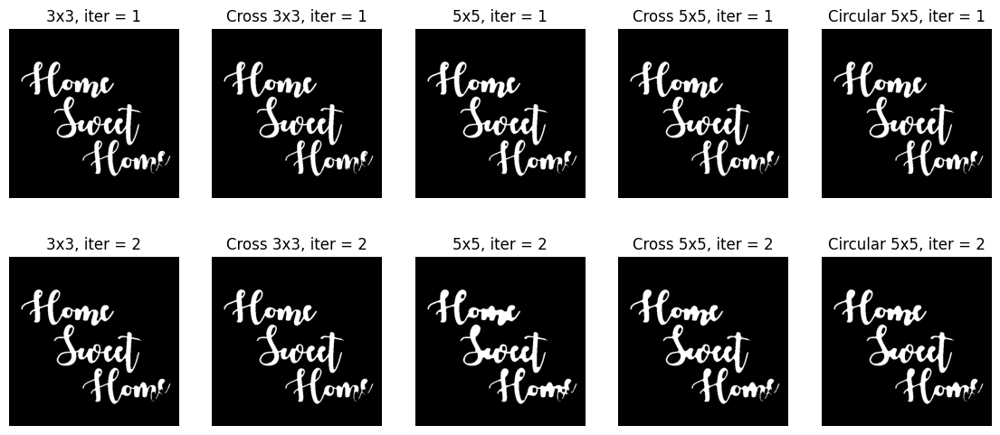

In [44]:
# Closing
plot_results(hsh_bin, kernels[0:5], cv2.MORPH_CLOSE, n_iter = 2, figsize=(14, 6))

### Referencias

[1] C. Platero Dueñas, *Apuntes de Visión Artificial. Capítulo 6: Procesamiento morfológico.* Universidad Miguel Hernández, 2007. Available: https://isa.umh.es/asignaturas/rvc/cap6VAProcMorf.pdf  
[2] P. Soille, Morphological Image Compositing. Springer, 2003.
[3] R. C. González and R. E. Woods, *Digital Image Processing*, 4th ed. Pearson, 2018.  
[4] K. A. Mat Said, A. B. Jambek, and N. Sulaiman, “A study of image processing using morphological opening and closing processes,” International Journal of Control Theory and Applications, vol. 9, no. 31, pp. 15–21, 2016. Available: https://www.researchgate.net/publication/314154399_A_study_of_image_processing_using_morphological_opening_and_closing_processes


